<a href="https://colab.research.google.com/github/nathaliasch/ExercicioRevisao1/blob/master/MVP_DeepLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <font color=purple size=10>MVP - Nathalia Schmucler</font>
***

##<font color=purple size=6>Disciplina: Machine Learning & Analytics (Sprint 2)</font>

# <font color=purple size=6>Deep Learning </font>
# <font color=purple size=4>Trata-se de um problema de visão computacional cujo objetivo é classificar as imagens de pinguins e tartarugas.</font>

<font color=purple size=4> O conjunto de dados foi obtido do repositório Kaggle (https://www.kaggle.com/datasets/abbymorgan/penguins-vs-turtles).</font>

<font color=purple size=4> Para esse problema será usado uma rede neural conulacional (CNN) e a biblioteca Keras.</font>

In [63]:
!pip install gdown
import gdown
import os
import zipfile

In [64]:
# fazendo os imports necessários

import tensorflow
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
import os
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt

# <font color=purple size=6>Carregando o dataset </font>

In [65]:
# Carregando o dataset de treino
file_id = "1VawP1SLoCxVTus1FmMPIRHTVyt5BmEOt"
url = f"https://drive.google.com/uc?id={file_id}"

# https://drive.google.com/file/d/1VawP1SLoCxVTus1FmMPIRHTVyt5BmEOt/view?usp=sharing

folder_path = "./dataset"  # Especifique a pasta onde baixará o arquivo
os.makedirs(folder_path, exist_ok=True)  # Cria a pasta de destino se necessário

output_train = "dataset/train.zip"  # Especifique o nome do arquivo e a extensão do mesmo
gdown.download(url, output_train)

Downloading...
From: https://drive.google.com/uc?id=1VawP1SLoCxVTus1FmMPIRHTVyt5BmEOt
To: /content/dataset/train.zip
100%|██████████| 19.0M/19.0M [00:00<00:00, 212MB/s]


'dataset/train.zip'

In [66]:
destination = 'dataset/images/'  # Path onde se encontra o arquivo 'train.zip'

os.makedirs(destination, exist_ok=True)  # Cria a pasta de destino se necessário

with zipfile.ZipFile(output_train, 'r') as zip_ref:
    zip_ref.extractall(destination)

In [67]:
# Carregando o dataset de validação
file_id = "1sySTNgA57oeyRdGk4rpMvhe0iWG1saeS"
url = f"https://drive.google.com/uc?id={file_id}"

# https://drive.google.com/file/d/1sySTNgA57oeyRdGk4rpMvhe0iWG1saeS/view?usp=sharing
# https://drive.google.com/file/d/136bYL28YzLlggILv2atTG_zIqPUE55nE/view?usp=sharing

output_valid = "dataset/valid.zip"  # Especifique o nome do arquivo e a extensão do mesmo
gdown.download(url, output_valid)

Downloading...
From: https://drive.google.com/uc?id=1sySTNgA57oeyRdGk4rpMvhe0iWG1saeS
To: /content/dataset/valid.zip
100%|██████████| 2.70M/2.70M [00:00<00:00, 170MB/s]


'dataset/valid.zip'

In [68]:
destination = 'dataset/images/'  # Path onde se encontra o arquivo 'valid.zip'

os.makedirs(destination, exist_ok=True)  # Cria a pasta de destino se necessário

with zipfile.ZipFile(output_valid, 'r') as zip_ref:
    zip_ref.extractall(destination)


In [69]:
# verifica se a pasta foi criada

r='/content/dataset/images'
print(os.listdir(r))

['train', 'valid']


In [70]:
path='/content/dataset/images/train'
path_valid='/content/dataset/images/valid'
print(f"Temos um total de {len(os.listdir(path))} imagens para o treinamento e avaliação do modelo de deep learning")

Temos um total de 500 imagens para o treinamento e avaliação do modelo de deep learning


In [71]:
print(f"Primeiras 20 imagens de treino: \n {os.listdir(path)[:20]}")

Primeiras 20 imagens de treino: 
 ['image_id_312.jpg', 'image_id_304.jpg', 'image_id_193.jpg', 'image_id_460.jpg', 'image_id_485.jpg', 'image_id_014.jpg', 'image_id_070.jpg', 'image_id_017.jpg', 'image_id_406.jpg', 'image_id_264.jpg', 'image_id_310.jpg', 'image_id_059.jpg', 'image_id_219.jpg', 'image_id_142.jpg', 'image_id_444.jpg', 'image_id_243.jpg', 'image_id_220.jpg', 'image_id_330.jpg', 'image_id_066.jpg', 'image_id_177.jpg']


In [72]:
import gdown
import pandas as pd

# Carregando o dataset de teste
file_id = "1B7znTxIv-8wJ0AzURX1gChYqFWOSCZJn"
url = f"https://drive.google.com/uc?id={file_id}"
output = "valid_annotations.json"
gdown.download(url, output, quiet=False)

# teste https://drive.google.com/file/d/1vPXOhvj8tRvdFB6IKZvnw_UlBxG58pTy/view?usp=sharing
# treino https://drive.google.com/file/d/1B7znTxIv-8wJ0AzURX1gChYqFWOSCZJn/view?usp=sharing



Downloading...
From: https://drive.google.com/uc?id=1B7znTxIv-8wJ0AzURX1gChYqFWOSCZJn
To: /content/valid_annotations.json
100%|██████████| 63.1k/63.1k [00:00<00:00, 65.8MB/s]


'valid_annotations.json'

In [73]:
# Lendo o arquivo JSON
dataset = pd.read_json(output)
dataset.head()

,id,image_id,category_id,bbox,area,segmentation,iscrowd
0,0,0,1,"[119, 25, 205, 606]",124230,[],0
1,1,1,1,"[131, 82, 327, 440]",143880,[],0
2,2,2,2,"[225, 298, 198, 185]",36630,[],0
3,3,3,2,"[468, 109, 172, 193]",33196,[],0
4,4,4,1,"[14, 242, 611, 154]",94094,[],0


In [74]:
#como boa prática as classes devem ser 0 e 1, sim e não

category_id = {
    2: 1,
    1: 0,
}

dataset['category_id'] = dataset['category_id'].replace(category_id)
dataset.head()


,id,image_id,category_id,bbox,area,segmentation,iscrowd
0,0,0,0,"[119, 25, 205, 606]",124230,[],0
1,1,1,0,"[131, 82, 327, 440]",143880,[],0
2,2,2,1,"[225, 298, 198, 185]",36630,[],0
3,3,3,1,"[468, 109, 172, 193]",33196,[],0
4,4,4,0,"[14, 242, 611, 154]",94094,[],0


In [75]:
category_id = {
    0: 'pinguim',
    1: 'tartaruga',
}

dataset['category_id'] = dataset['category_id'].replace(category_id)
dataset.head()


,id,image_id,category_id,bbox,area,segmentation,iscrowd
0,0,0,pinguim,"[119, 25, 205, 606]",124230,[],0
1,1,1,pinguim,"[131, 82, 327, 440]",143880,[],0
2,2,2,tartaruga,"[225, 298, 198, 185]",36630,[],0
3,3,3,tartaruga,"[468, 109, 172, 193]",33196,[],0
4,4,4,pinguim,"[14, 242, 611, 154]",94094,[],0


In [76]:
import os
import pandas as pd

path = "./dataset/images/train/"  # Especifique o caminho para as imagens

images =os.listdir(path)

heights, widths, filesize = [], [], []

# Loop que percorre cada uma das imagens extraídas
for fname in images:

    #labels.append(category_id)
    img_shape = mpimg.imread(path+fname).shape
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    #channels.append(img_shape[2])
    filesize.append(os.path.getsize(path+fname))

# Criação do dataset
df = pd.DataFrame({'images': images, 'height': heights,
                         'width': widths, 'filesize': filesize})

In [77]:
df

,images,height,width,filesize
0,image_id_312.jpg,640,640,55396
1,image_id_304.jpg,640,640,32494
2,image_id_193.jpg,640,640,67563
3,image_id_460.jpg,640,640,36553
4,image_id_485.jpg,640,640,19487
...,...,...,...,...
495,image_id_417.jpg,640,640,20248
496,image_id_210.jpg,640,640,34115
497,image_id_313.jpg,640,640,69567
498,image_id_196.jpg,640,640,21572


In [78]:
df_train = pd.concat([dataset, df], axis=1)


In [79]:
df_train

,id,image_id,category_id,bbox,area,segmentation,iscrowd,images,height,width,filesize
0,0,0,pinguim,"[119, 25, 205, 606]",124230,[],0,image_id_312.jpg,640,640,55396
1,1,1,pinguim,"[131, 82, 327, 440]",143880,[],0,image_id_304.jpg,640,640,32494
2,2,2,tartaruga,"[225, 298, 198, 185]",36630,[],0,image_id_193.jpg,640,640,67563
3,3,3,tartaruga,"[468, 109, 172, 193]",33196,[],0,image_id_460.jpg,640,640,36553
4,4,4,pinguim,"[14, 242, 611, 154]",94094,[],0,image_id_485.jpg,640,640,19487
...,...,...,...,...,...,...,...,...,...,...,...
495,495,495,tartaruga,"[92, 203, 456, 230]",104880,[],0,image_id_417.jpg,640,640,20248
496,496,496,pinguim,"[229, 359, 144, 131]",18864,[],0,image_id_210.jpg,640,640,34115
497,497,497,pinguim,"[258, 183, 126, 323]",40698,[],0,image_id_313.jpg,640,640,69567
498,498,498,pinguim,"[140, 55, 336, 517]",173712,[],0,image_id_196.jpg,640,640,21572


In [80]:
df = df_train.drop(['image_id', 'segmentation', 'iscrowd'], axis=1)
df

,id,category_id,bbox,area,images,height,width,filesize
0,0,pinguim,"[119, 25, 205, 606]",124230,image_id_312.jpg,640,640,55396
1,1,pinguim,"[131, 82, 327, 440]",143880,image_id_304.jpg,640,640,32494
2,2,tartaruga,"[225, 298, 198, 185]",36630,image_id_193.jpg,640,640,67563
3,3,tartaruga,"[468, 109, 172, 193]",33196,image_id_460.jpg,640,640,36553
4,4,pinguim,"[14, 242, 611, 154]",94094,image_id_485.jpg,640,640,19487
...,...,...,...,...,...,...,...,...
495,495,tartaruga,"[92, 203, 456, 230]",104880,image_id_417.jpg,640,640,20248
496,496,pinguim,"[229, 359, 144, 131]",18864,image_id_210.jpg,640,640,34115
497,497,pinguim,"[258, 183, 126, 323]",40698,image_id_313.jpg,640,640,69567
498,498,pinguim,"[140, 55, 336, 517]",173712,image_id_196.jpg,640,640,21572


# <font color=purple size=5>Analisando as imagens </font>

pinguim      250
tartaruga    250
Name: category_id, dtype: int64


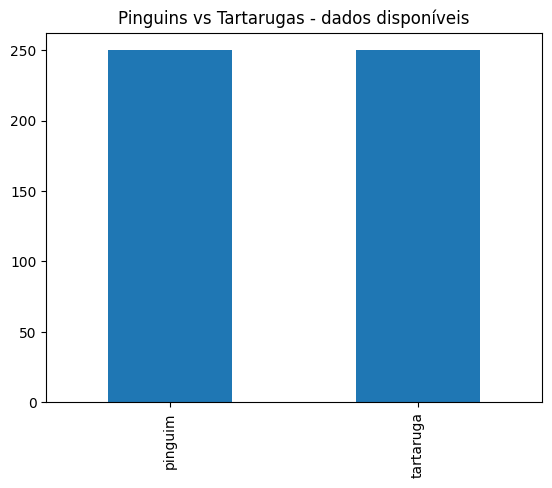

In [81]:
print((df['category_id']).value_counts())
pinguinsVStartarugas_count = dataset['category_id'].value_counts().plot.bar(title='Pinguins vs Tartarugas - dados disponíveis')

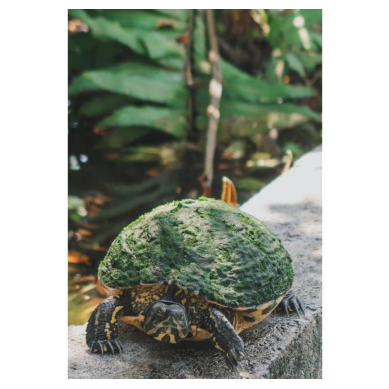

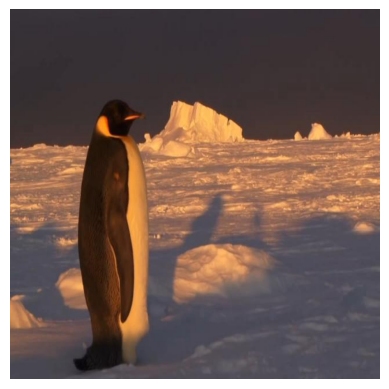

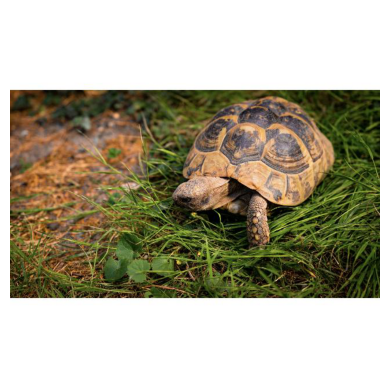

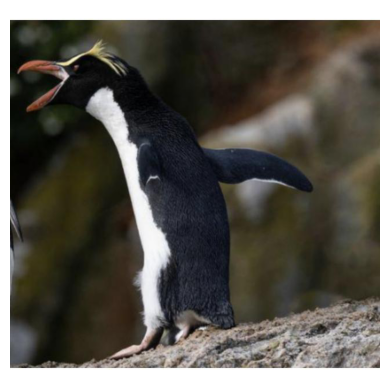

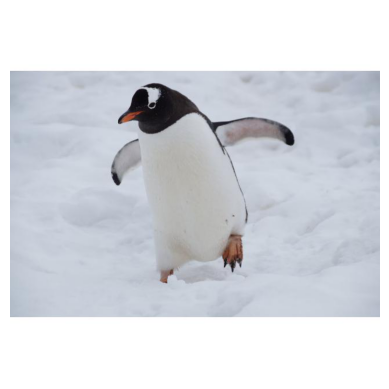

In [82]:
path = "./dataset/images/train/"  # Caminho para o diretório das imagens

# Lista os arquivos no diretório
files = os.listdir(path)

# Seleciona apenas as cinco primeiras imagens
images = files[:5]

# Exibe as três imagens
for image in images:
    image_path = os.path.join(path, image)
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()


# <font color=purple size=5>Divisão em treino e teste </font>

In [83]:
train, test =train_test_split(df[['images' , 'category_id']] ,test_size=0.3 ,random_state=42 , shuffle=True)

In [84]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
               images category_id
5    image_id_014.jpg     pinguim
116  image_id_246.jpg     pinguim
45   image_id_386.jpg     pinguim
16   image_id_220.jpg   tartaruga
462  image_id_232.jpg   tartaruga
..                ...         ...
106  image_id_225.jpg   tartaruga
270  image_id_163.jpg   tartaruga
348  image_id_004.jpg     pinguim
435  image_id_042.jpg     pinguim
102  image_id_421.jpg   tartaruga

[350 rows x 2 columns]
##### Test: #####
               images category_id
361  image_id_052.jpg   tartaruga
73   image_id_047.jpg     pinguim
374  image_id_116.jpg   tartaruga
155  image_id_031.jpg   tartaruga
104  image_id_207.jpg   tartaruga
..                ...         ...
266  image_id_273.jpg     pinguim
23   image_id_333.jpg   tartaruga
222  image_id_175.jpg     pinguim
261  image_id_174.jpg   tartaruga
426  image_id_296.jpg   tartaruga

[150 rows x 2 columns]


In [85]:
path = "./dataset/images/train/"

train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                    rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')



test_datagen=ImageDataGenerator(rescale=1./255)

train_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(128,128),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='category_id',
    subset='training' #training set
    )


val_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(128,128),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='category_id',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,path,
    target_size=(128,128),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='category_id',
    subset='training')

Found 280 validated image filenames belonging to 2 classes.
Found 70 validated image filenames belonging to 2 classes.
Found 150 validated image filenames belonging to 2 classes.


# <font color=purple size=5>Tratamento das imagens </font>

Found 1 validated image filenames belonging to 1 classes.


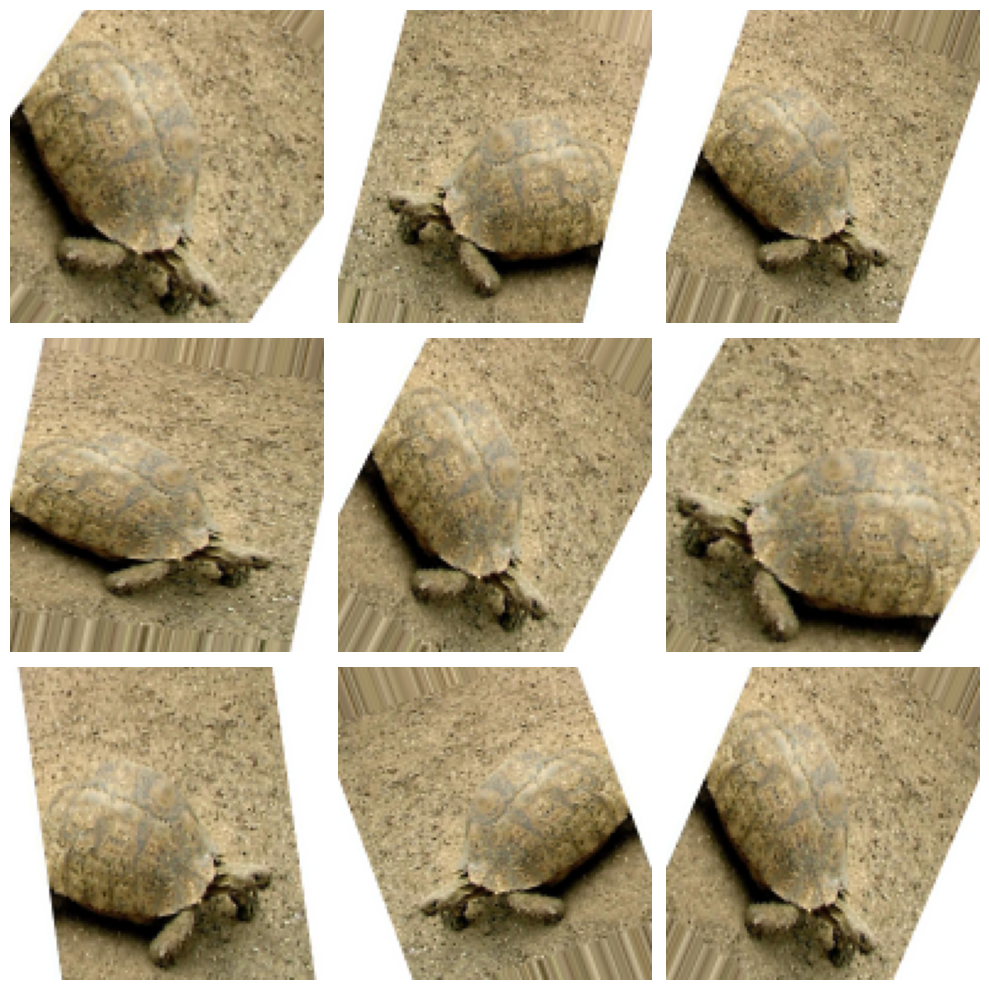

In [86]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    path,
    x_col='images',
    y_col='category_id',
    target_size=(128,128),
    class_mode='categorical'
)


plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()




# <font color=purple size=4> Criação do modelo</font>

In [87]:
num_classes = 2  # Número total de classes no seu dataset

model = models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3)))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(num_classes, activation='softmax'))



In [88]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

In [89]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 17, 17, 128)     

In [96]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

In [99]:
history = model.fit_generator(train_generator,
                              epochs=5,
                              validation_data=val_generator,
                              validation_steps=50)



<ipython-input-99-6fcf9908c1ad>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator,


Epoch 1/5
6/6 [==============================] - ETA: 0s - loss: 0.6860 - accuracy: 0.5571

6/6 [==============================] - 16s 2s/step - loss: 0.6860 - accuracy: 0.5571 - val_loss: 0.6936 - val_accuracy: 0.5429
Epoch 2/5
6/6 [==============================] - 13s 2s/step - loss: 0.6774 - accuracy: 0.5893
Epoch 3/5
6/6 [==============================] - 13s 2s/step - loss: 0.6769 - accuracy: 0.5929
Epoch 4/5
6/6 [==============================] - 19s 3s/step - loss: 0.6906 - accuracy: 0.5750
Epoch 5/5
6/6 [==============================] - 14s 2s/step - loss: 0.6828 - accuracy: 0.5964


2/2 [==============================] - 1s 189ms/step


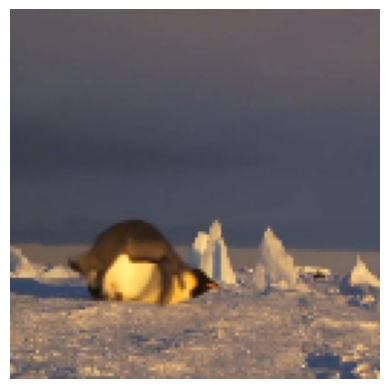

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.48941922


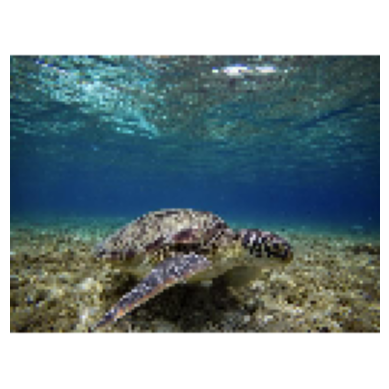

Label:  pinguim
Previsão:  tartaruga
Probabilidade:  0.5272211


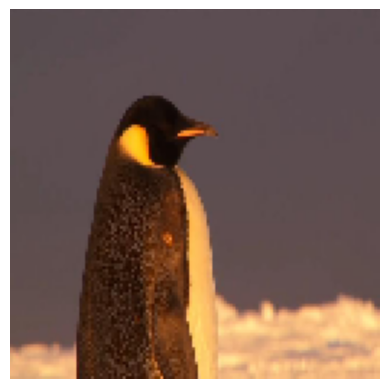

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.44951782


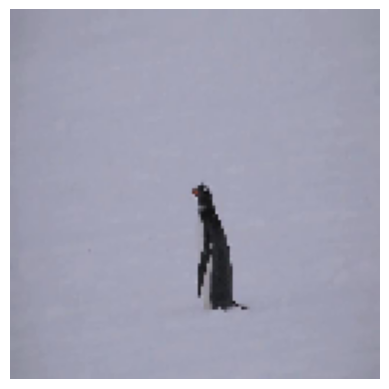

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.47445723


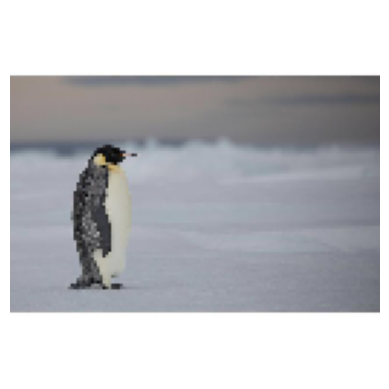

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.4748941


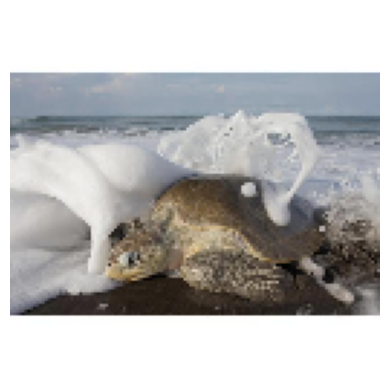

Label:  tartaruga
Previsão:  tartaruga
Probabilidade:  0.5211862


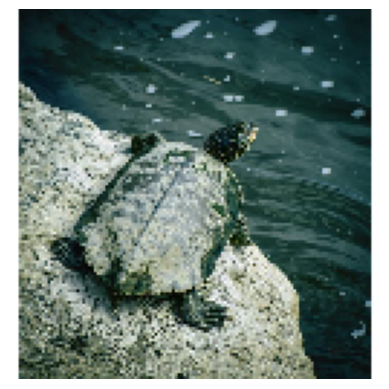

Label:  tartaruga
Previsão:  tartaruga
Probabilidade:  0.5225272


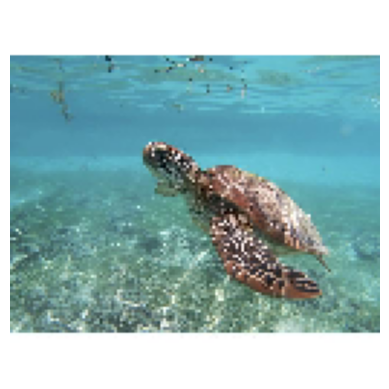

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.45376322


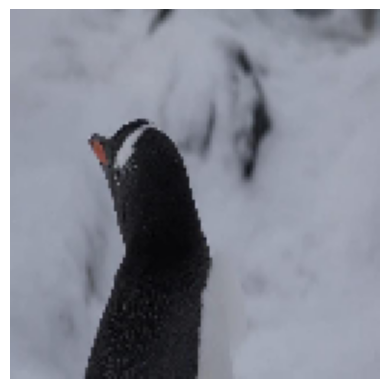

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.47904816


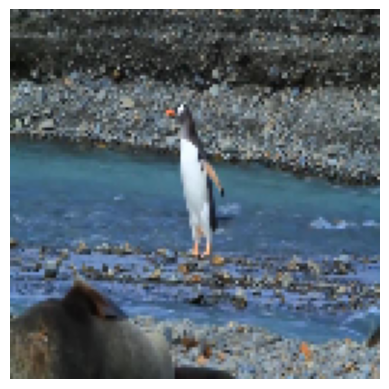

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.49364918


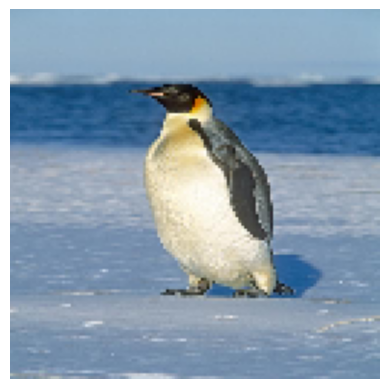

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.46666223


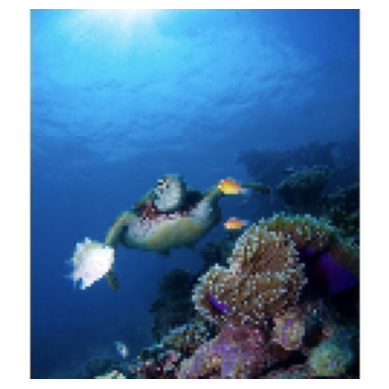

Label:  tartaruga
Previsão:  tartaruga
Probabilidade:  0.5491909


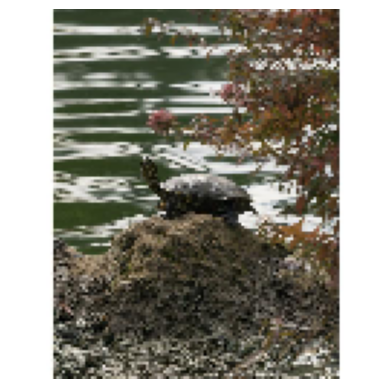

Label:  pinguim
Previsão:  tartaruga
Probabilidade:  0.5621352


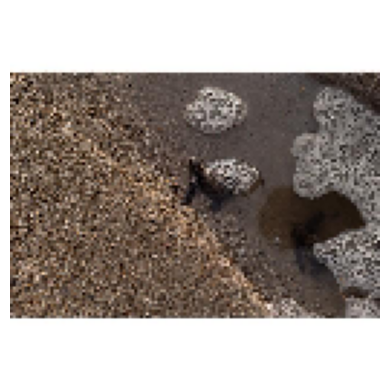

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.49683586


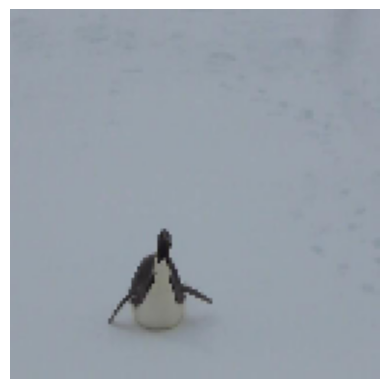

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.47883365


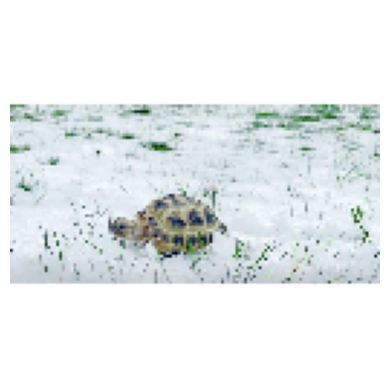

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.4648574


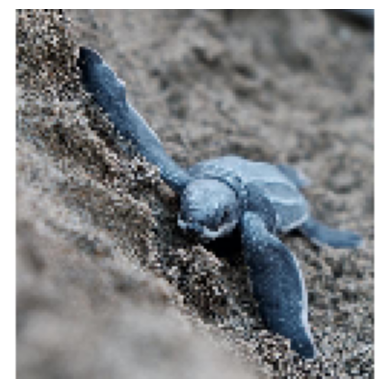

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.4890036


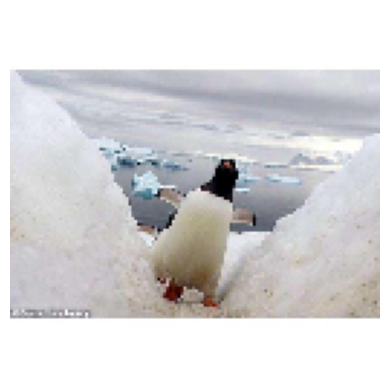

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.46698532


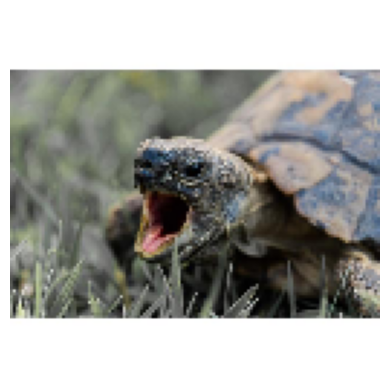

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.47281748


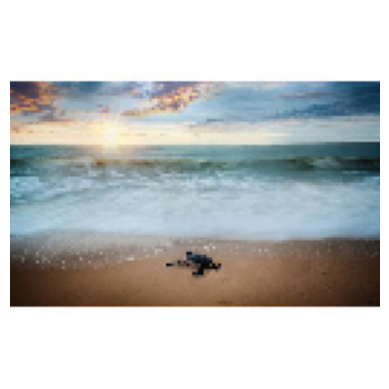

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.493725


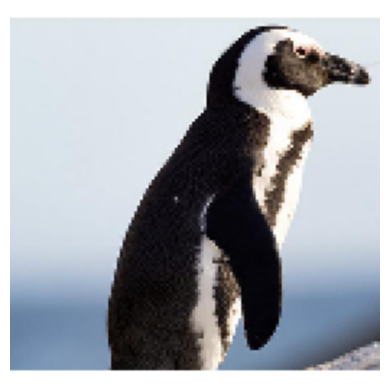

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.48733893


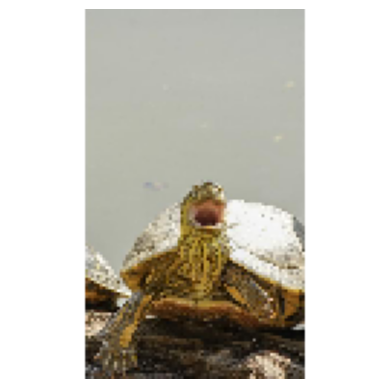

Label:  tartaruga
Previsão:  tartaruga
Probabilidade:  0.6120041


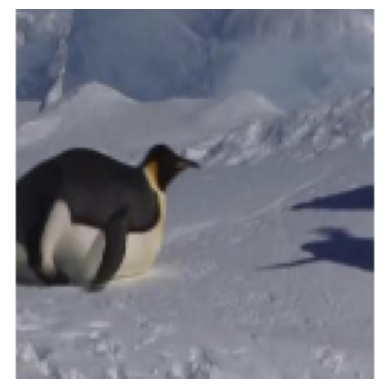

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.48196962


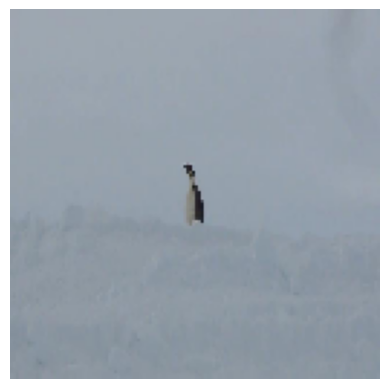

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.4827008


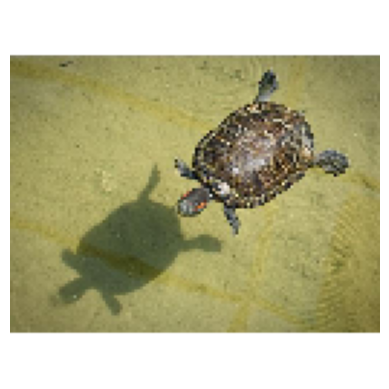

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.43104154


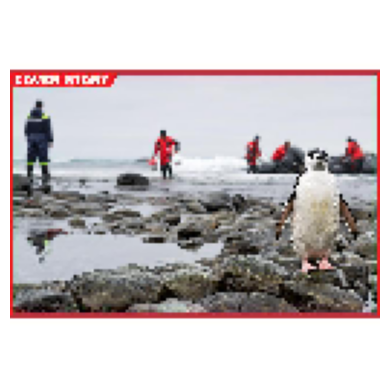

Label:  tartaruga
Previsão:  tartaruga
Probabilidade:  0.5892448


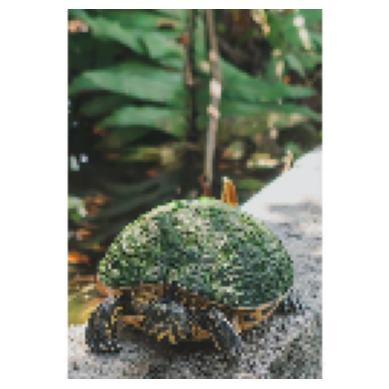

Label:  tartaruga
Previsão:  tartaruga
Probabilidade:  0.56294185


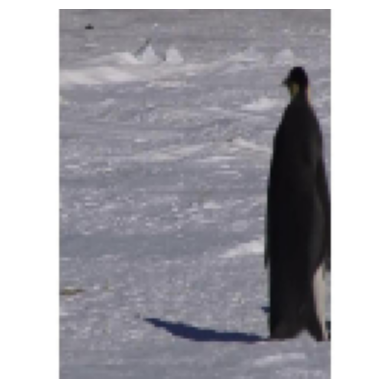

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.4777117


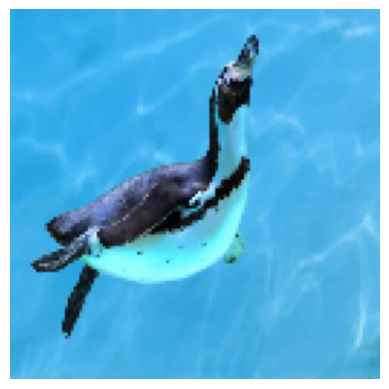

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.46566412


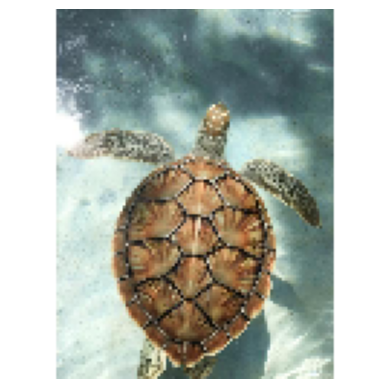

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.49881724


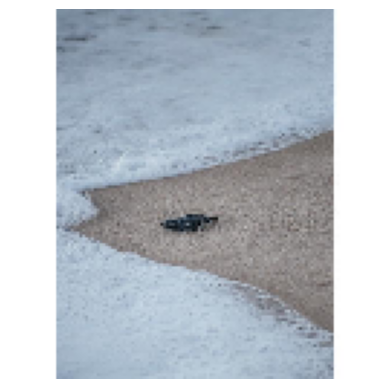

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.47732598


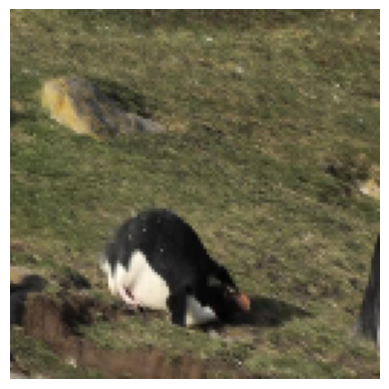

Label:  tartaruga
Previsão:  tartaruga
Probabilidade:  0.50404614


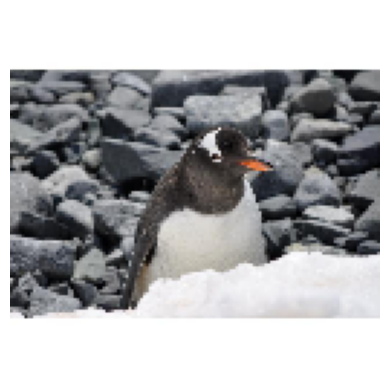

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.46261752


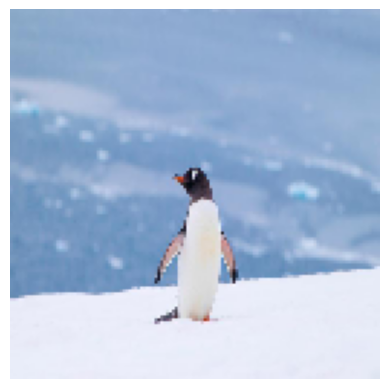

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.47731844


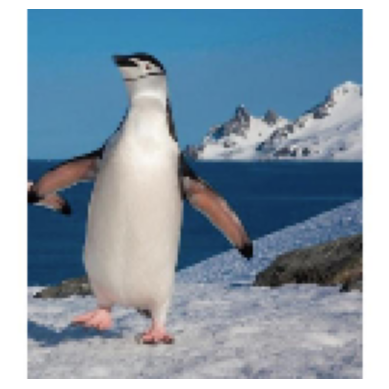

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.49411017


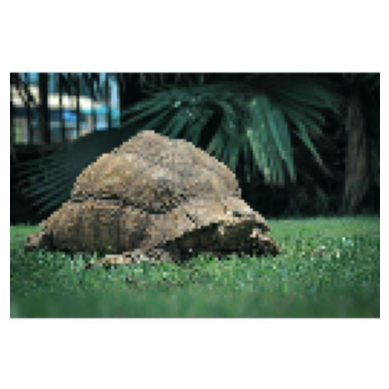

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.45654246


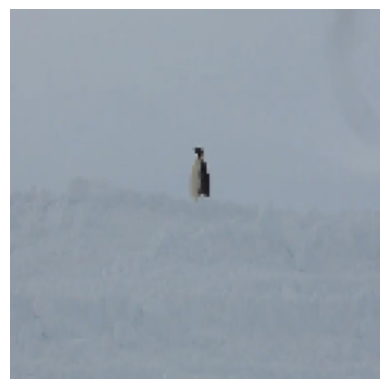

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.48328418


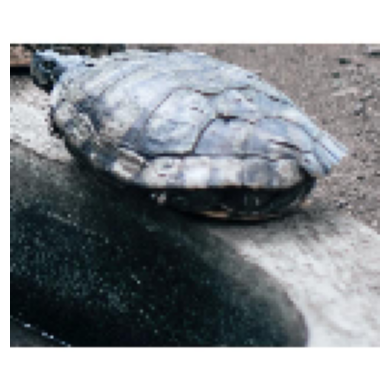

Label:  tartaruga
Previsão:  tartaruga
Probabilidade:  0.54181266


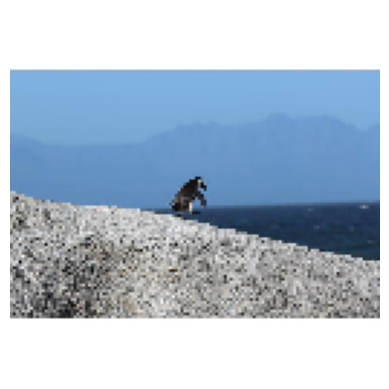

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.48230237


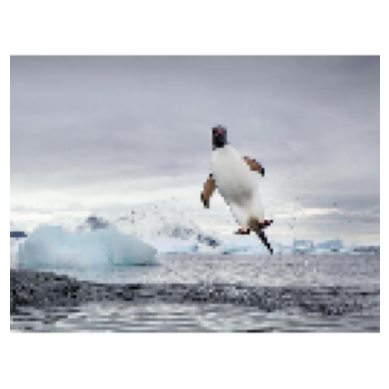

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.4720426


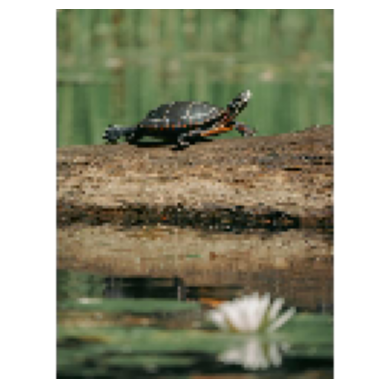

Label:  tartaruga
Previsão:  pinguim
Probabilidade:  0.4350689


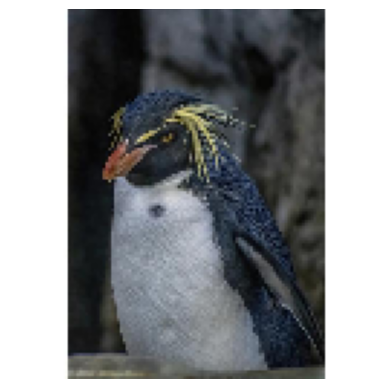

Label:  pinguim
Previsão:  tartaruga
Probabilidade:  0.5441332


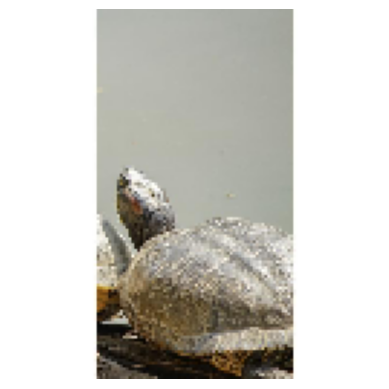

Label:  tartaruga
Previsão:  tartaruga
Probabilidade:  0.57153964


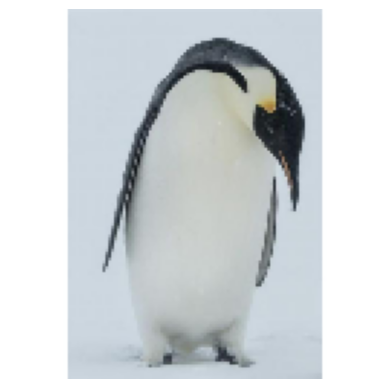

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.4678356


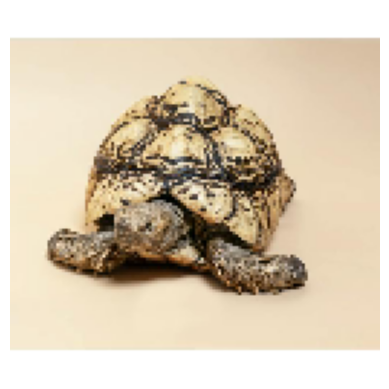

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.34388962


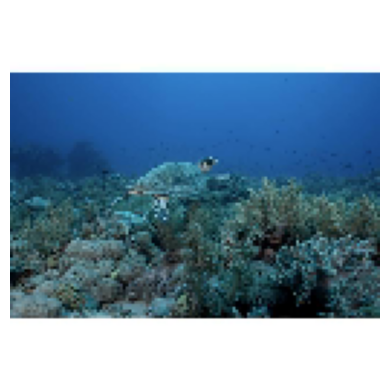

Label:  pinguim
Previsão:  tartaruga
Probabilidade:  0.5129543


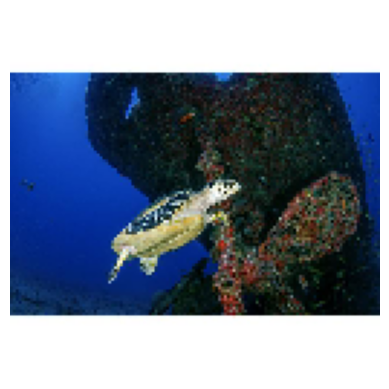

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.48701784


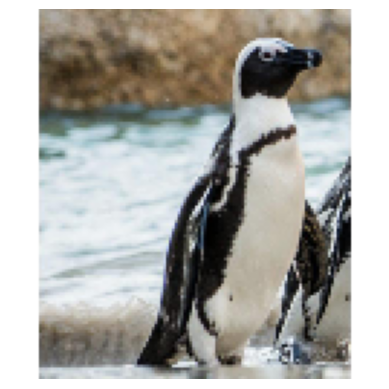

Label:  tartaruga
Previsão:  tartaruga
Probabilidade:  0.5456734


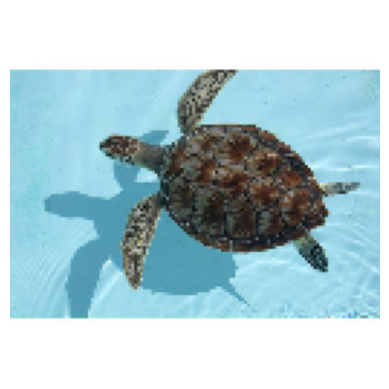

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.45646808


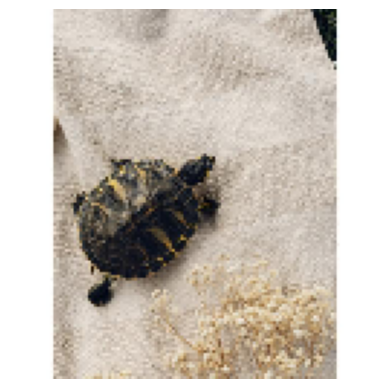

Label:  pinguim
Previsão:  pinguim
Probabilidade:  0.45200416


In [100]:
count = 0
y_pred = []
y_true = []
class_names = ['tartaruga', 'pinguim']

for batch in test_generator:
    count += 1

    if count == 2:
        break
    else:
        images = batch[0]
        labels = batch[1]
        predictions = model.predict(images)

        for i in range(len(images)):
            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]

            label = class_names[int(label)]  # Correção aqui
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'tartaruga' if prediction >= 0.5 else 'pinguim'


            #if y_pred[i] < 0.5:
             # y_pred[i] = 0
            #else:
             # y_pred[i] = 1


            y_pred.append(class_name)

            plt.imshow(images[i])
            plt.axis('off')
            plt.show()

            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)


In [101]:
loss, accuracy = model.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

<ipython-input-101-78954c843b8c>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  loss, accuracy = model.evaluate_generator(test_generator)


Test: accuracy = 0.473333  ;  loss = 0.707860 


In [102]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.54
Precision:  0.6126190476190476
Recall:  0.54
F1 Score:  0.5202937576499389


In [103]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion Matrix', cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()


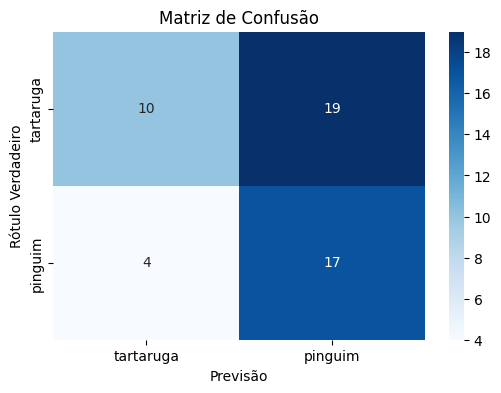

In [104]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Calcular matriz de confusão
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)

# Plotar matriz de confusão
plt.figure(figsize=(6, 4))
sns.heatmap(cnf_matrix, annot=True, cmap="Blues", fmt="d")
plt.title("Matriz de Confusão")
plt.xlabel("Previsão")
plt.ylabel("Rótulo Verdadeiro")
plt.xticks(ticks=[0.5, 1.5], labels=class_names)
plt.yticks(ticks=[0.5, 1.5], labels=class_names)
plt.show()


# <font color=purple size=5>Salvando o modelo </font>

In [106]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'dataset/pinguim_vs_tartaruga/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-20T2348.h5


In [107]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-07-20T2348.h5 carregado com sucesso
